<div class="alert alert-danger">

<h1>Take notice!</h1>
<ul>
    <li>This class will be recorded</li>
</ul>
    
</div>

# An Open Data case study:  Hot-spots for Arrests in LA over time


## What is an API?

Some examples:

Mapping API's

- [Google Maps API](https://developers.google.com/maps/documentation/javascript/overview#maps_map_simple-javascript)
- [Leaflet](https://leafletjs.com/)
- [Mapbox](https://docs.mapbox.com/mapbox-gl-js/example/)

Data API's
- [Twitter API](https://developer.twitter.com/en)
- [Metro API](https://developer.metro.net/api/)
- [Census API](https://www.census.gov/data/developers/guidance/api-user-guide.Example_API_Queries.html)


# Part 1: Mini project and code review: Mapping gun violence

As humans, we are troubled by recent events related to police brutality and gun violence. As planners, we are equipped with tools to do something about it. A quick scan reveals that open data exists on these issues, and one such source can be found with the Washington Post.

- https://github.com/washingtonpost/data-police-shootings

When you find a csv file posted in the GitHub account that is trustworthy, you can directly access it and pull the data into a Jupyter notebook (you may use this method to access your own csv data for example). However, you must first click on the "View raw" link and use **that** URL.

<img src="images/git%20view%20raw.png" width=600>

Next, copy the URL that produces the raw view of the data.

<img src="images/git raw url.png" width="600">

Now we can investigate and see if this data is usable within our Jupyter interface. Let's begin by importing some libraries.

In [1]:
# libraries
import pandas as pd
import geopandas as gpd

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

import contextily as ctx

Hey? What is `contextily`? Yes, it's a new library we are using that allows us to choose a basemap to put our data on top of. We'll learn more about this as we move along.

- https://github.com/darribas/contextily

In [2]:
# import the data into a new variable
df = pd.read_csv("https://raw.githubusercontent.com/washingtonpost/data-police-shootings/master/v2/fatal-police-shootings-data.csv")

In [3]:
# check the data, specifically for the latitude and longitude columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9345 entries, 0 to 9344
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          9345 non-null   int64  
 1   date                        9345 non-null   object 
 2   threat_type                 9272 non-null   object 
 3   flee_status                 8062 non-null   object 
 4   armed_with                  9131 non-null   object 
 5   city                        9273 non-null   object 
 6   county                      4561 non-null   object 
 7   state                       9345 non-null   object 
 8   latitude                    8302 non-null   float64
 9   longitude                   8302 non-null   float64
 10  location_precision          8302 non-null   object 
 11  name                        8927 non-null   object 
 12  age                         8907 non-null   float64
 13  gender                      9317 

### From dataframe (df) to geodataframe (gdf)
Whenever you bring data into a jupyter notebook that is in a `json` or `csv` format, *if* the data contains separate columns for latitude and longitude, you can convert the data into a geodataframe for mapping purposes.

Things to note: If the data has latitude and longitude coordinates, it is a **[geographic coordinate system (GCS)](https://en.wikipedia.org/wiki/World_Geodetic_System)** with a crs code `epsg:4326`.

In [4]:
# convert df to gdf
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
gdf = gpd.GeoDataFrame(df, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df.longitude, df.latitude))

### What is the projection?

In [5]:
# output the data's projection, description in class that the bounds are necessary to understand the data (also this can be a reason the data doesn't plot). This is mercator projection.
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The key output here is `WGS 84` indicating that the data is in geographic

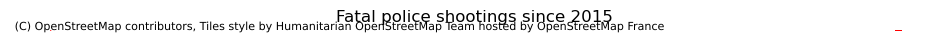

In [6]:
# start the plot
fig, ax = plt.subplots(figsize=(12,12))

# add the data options
gdf.plot(ax=ax, 
        marker='X',
        markersize=10,
        color='red')

# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Fatal police shootings since 2015')

# add a basemap
ctx.add_basemap(ax, crs=4326) # note that we must specify the projection here (crs)

Note: You have many `marker` [options](https://matplotlib.org/stable/api/markers_api.html)

Nice. What makes this process **powerful**? And what are potential **pitfalls**?

In [7]:
#calculating bounding box
bbox = gdf.total_bounds

print('Bounding Box:')
print('min Longitude:', bbox[0])
print('min Latitude:', bbox[1])
print('min Longitude:',bbox[2])
print('min Longitude:',bbox[3])

Bounding Box:
min Longitude: -9007175462532118.0
min Latitude: 19.4975033
min Longitude: -67.8671657
min Longitude: 71.3012553


In [8]:
#he listed out printing the longitude and latitude to see the issue
us = gpd.read_file('unitedStates-Copy1.json')
us.set_crs('epsg:4326')

,id,name,density,geometry
0,01,Alabama,94.650,"POLYGON ((-87.35930 35.00118, -85.60667 34.984..."
1,02,Alaska,1.264,"MULTIPOLYGON (((-131.60202 55.11798, -131.5691..."
2,04,Arizona,57.050,"POLYGON ((-109.04250 37.00026, -109.04798 31.3..."
3,05,Arkansas,56.430,"POLYGON ((-94.47384 36.50186, -90.15254 36.496..."
4,06,California,241.700,"POLYGON ((-123.23326 42.00619, -122.37885 42.0..."
5,08,Colorado,49.330,"POLYGON ((-107.91973 41.00391, -105.72895 40.9..."
6,09,Connecticut,739.100,"POLYGON ((-73.05353 42.03905, -71.79931 42.022..."
7,10,Delaware,464.300,"POLYGON ((-75.41409 39.80446, -75.50720 39.683..."
8,11,District of Columbia,10065.000,"POLYGON ((-77.03526 38.99387, -76.90929 38.895..."
9,12,Florida,353.400,"POLYGON ((-85.49714 30.99754, -85.00421 31.003..."


In [9]:
bbox = us.total_bounds

print('Bounding Box:')
print('min Longitude:', bbox[0])
print('min Latitude:', bbox[1])
print('min Longitude:',bbox[2])
print('min Longitude:',bbox[3])

Bounding Box:
min Longitude: -188.90491
min Latitude: 17.929556
min Longitude: -65.626797
min Longitude: 71.351633


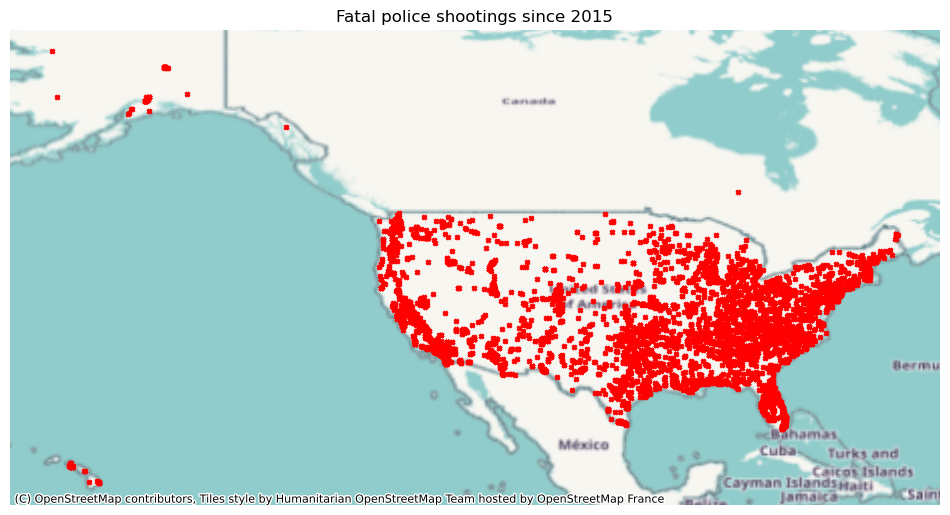

In [10]:
# Adding the clipped box
fig, ax = plt.subplots(figsize=(12,12))

# add the data options
ax = gdf.clip([-189,18,-66,71]).plot(ax=ax, 
        marker='X',
        markersize=10,
        color='red')

# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Fatal police shootings since 2015')

# add a basemap
ctx.add_basemap(ax, crs=4326) #

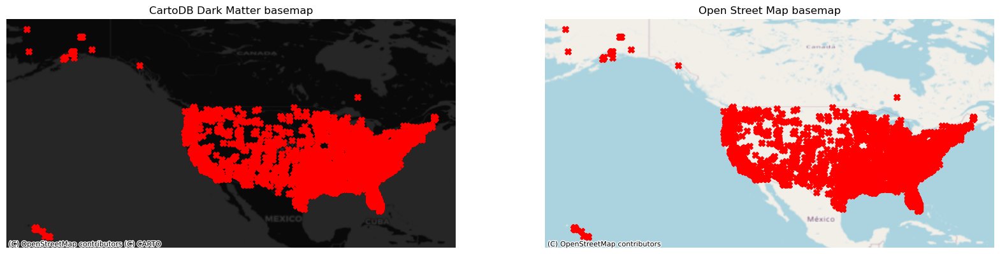

In [11]:
# two maps, different basemaps
fig, ax = plt.subplots(1,2,figsize=(20,12))

# Note that 2 plots were requested, so ax has two items: ax[0] and ax[1]
usbounds = [-189,18,-66,71]
# first map
gdf.clip(usbounds).plot(ax=ax[0], 
                      marker='X',
                      markersize=50,
                      color='red')

ax[0].axis('off')
ax[0].set_title('CartoDB Dark Matter basemap')

ctx.add_basemap(ax[0], source=ctx.providers.CartoDB.DarkMatter,crs=4326)

# second map
gdf.clip(usbounds).plot(ax=ax[1], 
                      marker='X',
                      markersize=50,
                      color='red')

ax[1].axis('off')
ax[1].set_title('Open Street Map basemap')

ctx.add_basemap(ax[1], source=ctx.providers.OpenStreetMap.Mapnik,crs=4326)

### Multiple cities with a for loop

One of the fundamental features of coding is the "for" loop. It allows you to generate multiple outputs with a few lines of code by "looping" through various elements.

- pick cities to map 
- create a list of cities
- loop through each city to generate maps

In [12]:
# create a list of routes
cities = ["Los Angeles","San Francisco", "New York"]

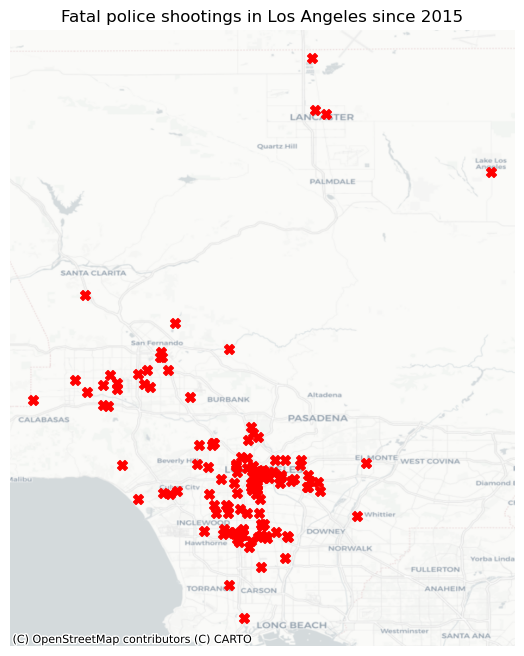

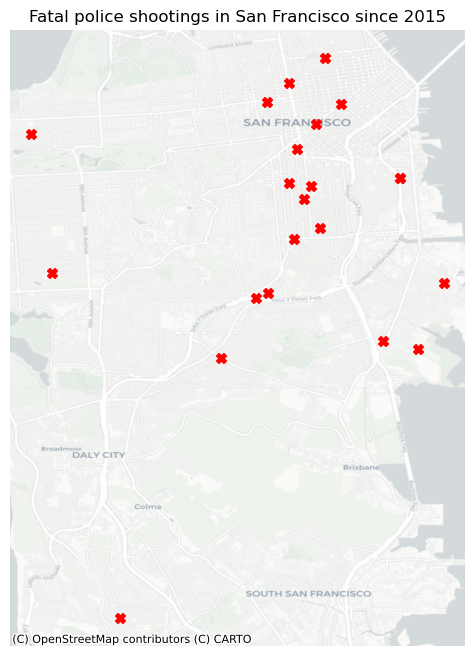

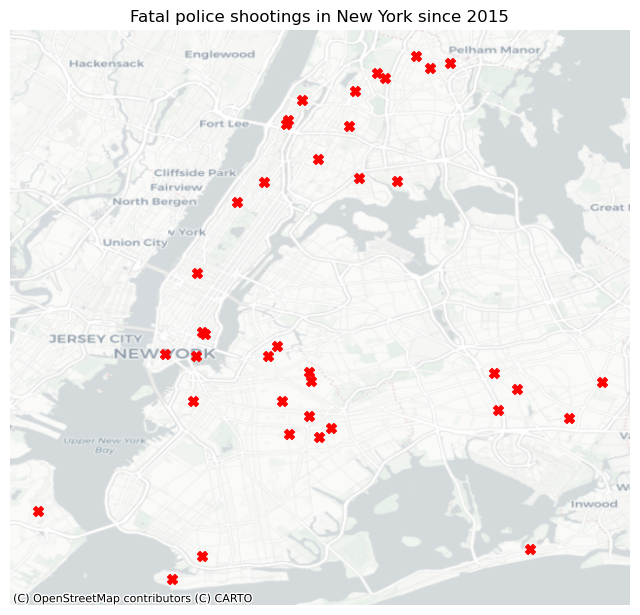

In [13]:
# loop through cities
for city in cities:

    # map it
    fig, ax = plt.subplots(figsize=(8,8))

    # map options: notice the query to filter by individual city
    gdf[gdf.city == city].plot(ax=ax, 
                          marker='X',
                          markersize=50,
                          color='red')

    # no axes
    ax.axis('off')

    # title
    ax.set_title('Fatal police shootings in '+str(city) + ' since 2015')

    #basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)

# Part 2 - Socrata: An open data portal for governments

Many governments use <a href="https://dev.socrata.com/" target="_blank">socrata</a> as their platform to serve data to the public. 
<img src="../images/socrata.png" width=600>

Example: [LA County Open Data Portal](https://data.lacounty.gov/)

<table>
    <tr>
        <td><a href="https://opendata.cityofnewyork.us/" target="_blank"><img src="images/ny.png" width=400></a></td>
        <td><a href="https://datasf.org/opendata/" target="_blank"><img src="images/sf.png" width=400></a></td>
    </tr>
    <tr>
        <td><a href="https://data.cityofchicago.org/" target="_blank"><img src="images/ch.png" width=400></a></td>
        <td><a href="https://data.lacity.org/" target="_blank"><img src="images/la.png" width=400></a></td>
    </tr>
</table>

For this tutorial, we will look at LAPD's arrest data:

https://data.lacity.org/A-Safe-City/Arrest-Data-from-2020-to-Present/amvf-fr72

The <a href="https://dev.socrata.com/docs/endpoints.html" target="_blank">Socrata API</a> allows direct and real-time access to open data.

To access the data, we will use the `sodapy` library: https://github.com/xmunoz/sodapy

Instructions on how to use `sodapy` to access data for this dataset:

<a href="https://data.lacity.org/Public-Safety/Arrest-Data-from-2020-to-Present/amvf-fr72/about_data" target="_blank"><img src="images/ladata1.png"></a>

https://dev.socrata.com/foundry/data.lacity.org/amvf-fr72

### Question:
- What is the difference between exporting the data and using the API?

### It's time to start coding: importing libraries

Let's begin our python journey. First, we identify the libraries we will use, and import them into our project:
- `pandas`
- `plotly express` - [documentation](https://plotly.com/python/plotly-express/)
- `sodapy` - [documentation](https://github.com/xmunoz/sodapy)

*Notice that we will NOT be using geopandas! Don't worry, there will still be very rewarding maps in this session*

In [14]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

### Creating a socrata client
Next, we acquire the data using the socrata API. Use the socrata documentation to grab the code syntax for our crime data.
- https://dev.socrata.com/foundry/data.lacity.org/amvf-fr72

In [15]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("amvf-fr72", limit=2000)

# Convert to pandas DataFrame
arrests = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
arrests.sample(2)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,chrg_grp_cd,grp_description,chrg_desc,bkg_date,bkg_time,bkg_location,bkg_loc_cd
1932,230612813,RFC,2023-07-15T00:00:00.000,0005,06,Hollywood,0677,44,M,H,...,NaN,8,57,13,Prostitution/Allied,PROSTITUTION,NaN,NaN,NaN,NaN
470,6639088,BOOKING,2023-07-10T00:00:00.000,2015,13,Newton,1326,51,M,W,...,7,13,6,07,Vehicle Theft,GRAND THEFT AUTO/HORSE/ETC,2023-07-11T00:00:00.000,0015,METRO - JAIL DIVISION,4273


### Import data based on a query string
That's great! But what if you wanted something specific, like "all arrests in July, 2021?"

In [16]:
# add a "where" statement
results = client.get("amvf-fr72", 
                     limit = 10000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "arst_date between '2023-01-01T00:00:00' and '2023-02-01T00:00:00'"
                    )

In [17]:
# Convert to pandas DataFrame
arrests = pd.DataFrame.from_records(results)

### Data Exploration and Analysis

In [18]:
# how many rows and columns?
arrests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4782 entries, 0 to 4781
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           4782 non-null   object
 1   report_type      4782 non-null   object
 2   arst_date        4782 non-null   object
 3   time             4781 non-null   object
 4   area             4782 non-null   object
 5   area_desc        4782 non-null   object
 6   rd               4782 non-null   object
 7   age              4782 non-null   object
 8   sex_cd           4782 non-null   object
 9   descent_cd       4782 non-null   object
 10  chrg_grp_cd      4479 non-null   object
 11  grp_description  4479 non-null   object
 12  arst_typ_cd      4782 non-null   object
 13  charge           4782 non-null   object
 14  chrg_desc        4479 non-null   object
 15  dispo_desc       4405 non-null   object
 16  location         4782 non-null   object
 17  crsst            1888 non-null   

In [19]:
# what fields and datatypes?
arrests.dtypes
arrests.info(verbose=True, show_counts =True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4782 entries, 0 to 4781
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           4782 non-null   object
 1   report_type      4782 non-null   object
 2   arst_date        4782 non-null   object
 3   time             4781 non-null   object
 4   area             4782 non-null   object
 5   area_desc        4782 non-null   object
 6   rd               4782 non-null   object
 7   age              4782 non-null   object
 8   sex_cd           4782 non-null   object
 9   descent_cd       4782 non-null   object
 10  chrg_grp_cd      4479 non-null   object
 11  grp_description  4479 non-null   object
 12  arst_typ_cd      4782 non-null   object
 13  charge           4782 non-null   object
 14  chrg_desc        4479 non-null   object
 15  dispo_desc       4405 non-null   object
 16  location         4782 non-null   object
 17  crsst            1888 non-null   

In [20]:
# what are the first 5 rows?
arrests.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,crsst,lat,lon,location_1,bkg_date,bkg_time,bkg_location,bkg_loc_cd
0,6528046,BOOKING,2023-01-01T00:00:00.000,0015,13,Newton,1317,39,M,H,...,DISTRICT ATTORNEY REJECT,20TH,ALAMEDA,34.018,-118.2397,"{'type': 'Point', 'coordinates': [-118.2397, 3...",2023-01-01T00:00:00.000,0147,77TH ST,4212
1,6528349,BOOKING,2023-01-01T00:00:00.000,2115,01,Central,0161,20,M,H,...,CITY ATTORNEY REJECT,11TH ST,HOPE ST,34.0483,-118.2631,"{'type': 'Point', 'coordinates': [-118.2631, 3...",2023-01-02T00:00:00.000,0034,METRO - JAIL DIVISION,4273
2,6528200,BOOKING,2023-01-01T00:00:00.000,1230,14,Pacific,1494,43,M,O,...,FELONY COMPLAINT FILED,400 WORLD WAY,NaN,33.9455,-118.4,"{'type': 'Point', 'coordinates': [-118.4, 33.9...",2023-01-01T00:00:00.000,1401,PACIFIC,4214
3,6528107,BOOKING,2023-01-01T00:00:00.000,0100,15,N Hollywood,1562,36,M,O,...,FELONY COMPLAINT FILED,12400 MOORPARK ST,NaN,34.1533,-118.4058,"{'type': 'Point', 'coordinates': [-118.4058, 3...",2023-01-01T00:00:00.000,0722,METRO - JAIL DIVISION,4273
4,6528091,BOOKING,2023-01-01T00:00:00.000,0355,06,Hollywood,0646,21,F,W,...,CITY ATTORNEY REJECT,SUNSET BL,CAHUENGA BL,34.098,-118.3295,"{'type': 'Point', 'coordinates': [-118.3295, 3...",2023-01-01T00:00:00.000,0443,HOLLYWOOD,4206


## Introducting plotly

Now, use plotly express to create a bar chart.

- https://plotly.com/python/bar-charts/

What are the differences between matplotlib and plotly?

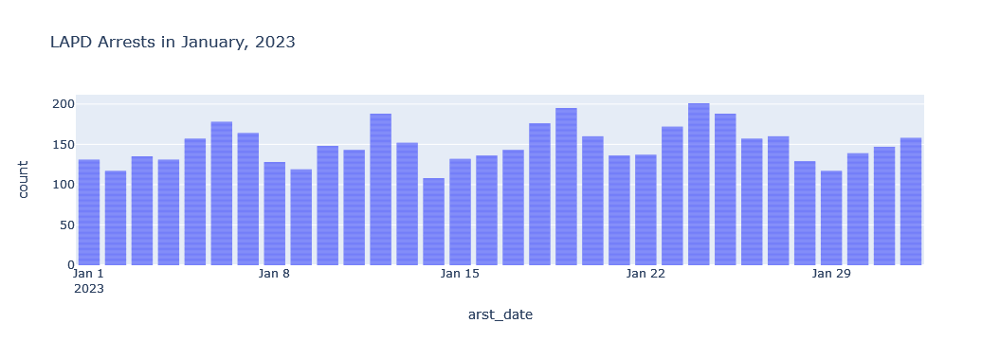

In [21]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(arrests,
       x='arst_date',
       title='LAPD Arrests in January, 2023'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

### Label axis

In plotly, you can relabel text by providing a dictionary as shown below:

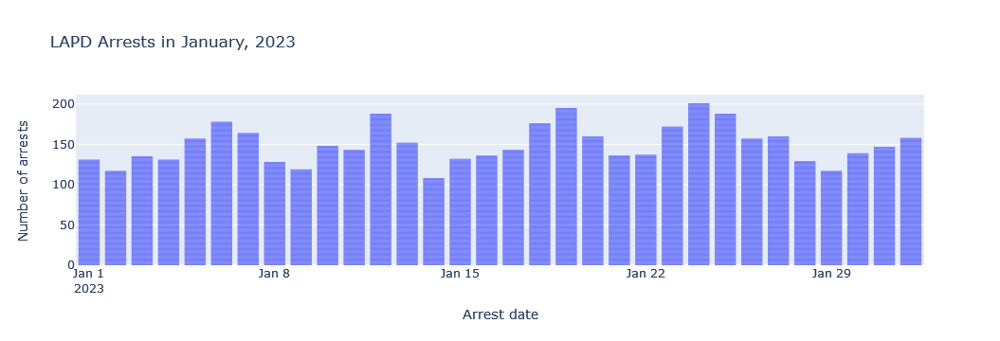

In [22]:
# add labels by providing a dict
fig = px.bar(
        arrests,
        x='arst_date',
        title='LAPD Arrests in January, 2023',
        labels={
            'arst_date':'Arrest date',
            'count':'Number of arrests'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Let's dig in further... what if we want to see the distribution of charge types by day?

In [23]:
# show me distinct value of charges
arrests.grp_description.unique().tolist()

['Receive Stolen Property',
 'Narcotic Drug Laws',
 'Aggravated Assault',
 'Driving Under Influence',
 'Robbery',
 'Vehicle Theft',
 'Other Assaults',
 'Larceny',
 'Weapon (carry/poss)',
 'Miscellaneous Other Violations',
 'Forgery/Counterfeit',
 'Burglary',
 'Moving Traffic Violations',
 'Homicide',
 'Sex (except rape/prst)',
 'Against Family/Child',
 nan,
 'Disorderly Conduct',
 'Drunkeness',
 'Fraud/Embezzlement',
 'Prostitution/Allied',
 'Liquor Laws',
 'Rape',
 'Non-Criminal Detention',
 'Disturbing the Peace',
 'Gambling',
 'Federal Offenses']

In [24]:
# show me distinct value of charges
arrest_by_charge = arrests.value_counts('grp_description').reset_index(name='count')
arrest_by_charge

,grp_description,count
0,Aggravated Assault,679
1,Miscellaneous Other Violations,596
2,Other Assaults,518
3,Driving Under Influence,420
4,Narcotic Drug Laws,381
5,Weapon (carry/poss),356
6,Larceny,278
7,Vehicle Theft,218
8,Robbery,179
9,Prostitution/Allied,148


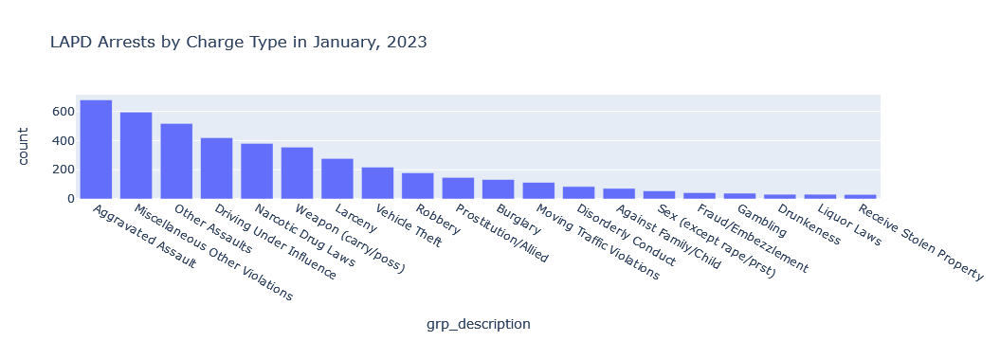

In [25]:
# plot the top 20 charges
fig = px.bar(arrest_by_charge.head(20),
       x='grp_description',
       y='count',
       title='LAPD Arrests by Charge Type in January, 2023')

fig.show()

### Stacked bar charts

What if you wanted to find out the distribution of crime types per day?

In [26]:
arrests_grouped = arrests.value_counts(['arst_date','grp_description']).reset_index(name='count')
arrests_grouped

,arst_date,grp_description,count
0,2023-01-24T00:00:00.000,Miscellaneous Other Violations,32
1,2023-01-25T00:00:00.000,Prostitution/Allied,32
2,2023-01-14T00:00:00.000,Aggravated Assault,30
3,2023-01-12T00:00:00.000,Miscellaneous Other Violations,30
4,2023-01-13T00:00:00.000,Aggravated Assault,28
...,...,...,...
556,2023-01-03T00:00:00.000,Prostitution/Allied,1
557,2023-01-22T00:00:00.000,Receive Stolen Property,1
558,2023-01-17T00:00:00.000,Drunkeness,1
559,2023-01-15T00:00:00.000,Disorderly Conduct,1


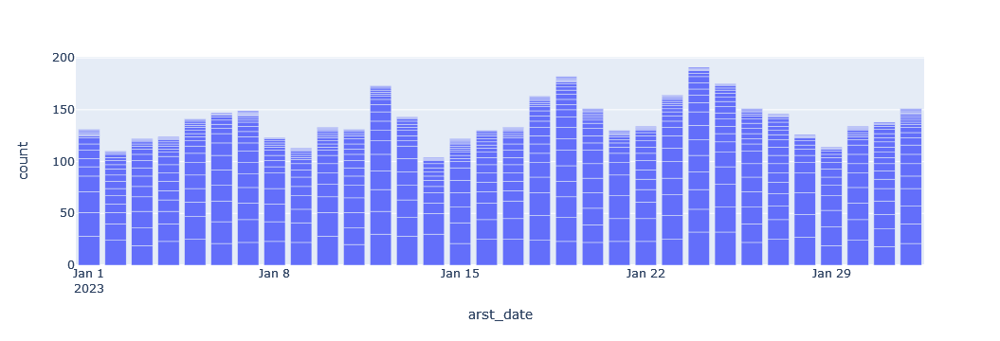

In [27]:
# make a bar chart
fig = px.bar(arrests_grouped,
       x='arst_date',
       y='count'
)

fig.show()

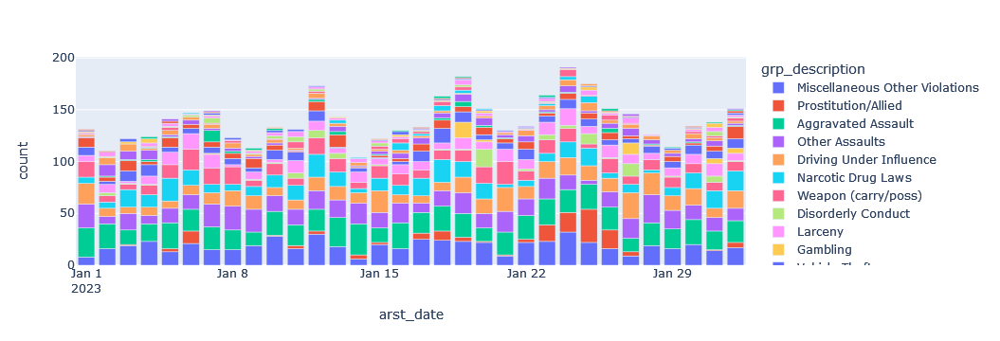

In [28]:
# make a stacked bar chart
fig = px.bar(arrests_grouped,
       x='arst_date',
       y='count',
       color='grp_description' # this creates the "stack"
)

fig.show()

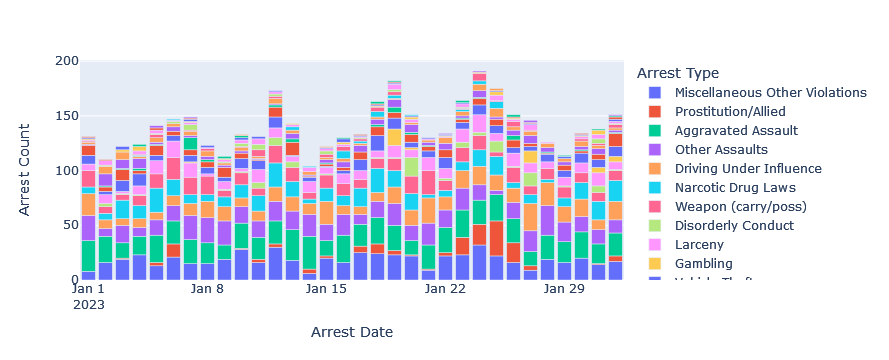

In [29]:
#cleaning up data
fig = px.bar(arrests_grouped,
       x='arst_date',
       y='count',
       color='grp_description' # this creates the "stack"
)

fig.update_layout(
    xaxis_title='Arrest Date',
    yaxis_title='Arrest Count',
    legend_title='Arrest Type'
)

fig.show()

Now it's your turn!

* Add a title
* Clean up the labels (arst_date, grp_description, etc)

## Data cleanup: subsetting your data

Let's go back to the original dataset.

In [30]:
arrests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4782 entries, 0 to 4781
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           4782 non-null   object
 1   report_type      4782 non-null   object
 2   arst_date        4782 non-null   object
 3   time             4781 non-null   object
 4   area             4782 non-null   object
 5   area_desc        4782 non-null   object
 6   rd               4782 non-null   object
 7   age              4782 non-null   object
 8   sex_cd           4782 non-null   object
 9   descent_cd       4782 non-null   object
 10  chrg_grp_cd      4479 non-null   object
 11  grp_description  4479 non-null   object
 12  arst_typ_cd      4782 non-null   object
 13  charge           4782 non-null   object
 14  chrg_desc        4479 non-null   object
 15  dispo_desc       4405 non-null   object
 16  location         4782 non-null   object
 17  crsst            1888 non-null   

That's a lot of fields. Let's create a subset of the data with just the following fields:

- `arst_date`
- `age`
- `descent_cd`
- `grp_description`
- `lat`
- `lon`

In list format:
```
['arst_date','age','descent_cd','grp_description','lat','lon']
```

In [31]:
# subset the data below (don't forget to add .copy at the end)
arrests_mini = arrests[['arst_date','age','descent_cd','grp_description','lat','lon']].copy()

In [32]:
# get info for our subset data
arrests_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4782 entries, 0 to 4781
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   arst_date        4782 non-null   object
 1   age              4782 non-null   object
 2   descent_cd       4782 non-null   object
 3   grp_description  4479 non-null   object
 4   lat              4782 non-null   object
 5   lon              4782 non-null   object
dtypes: object(6)
memory usage: 224.3+ KB


Our `lat` and `lon` columns need to be of data type float. Let's convert them.

In [33]:
# convert lat/lon's to floats
arrests_mini['lat'] = arrests_mini['lat'].astype(float)
arrests_mini['lon'] = arrests_mini['lon'].astype(float)
arrests_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4782 entries, 0 to 4781
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   arst_date        4782 non-null   object 
 1   age              4782 non-null   object 
 2   descent_cd       4782 non-null   object 
 3   grp_description  4479 non-null   object 
 4   lat              4782 non-null   float64
 5   lon              4782 non-null   float64
dtypes: float64(2), object(4)
memory usage: 224.3+ KB


What happens if we create a scatter plot, placing `lon` in the x-axis `lat` in the y-axis?

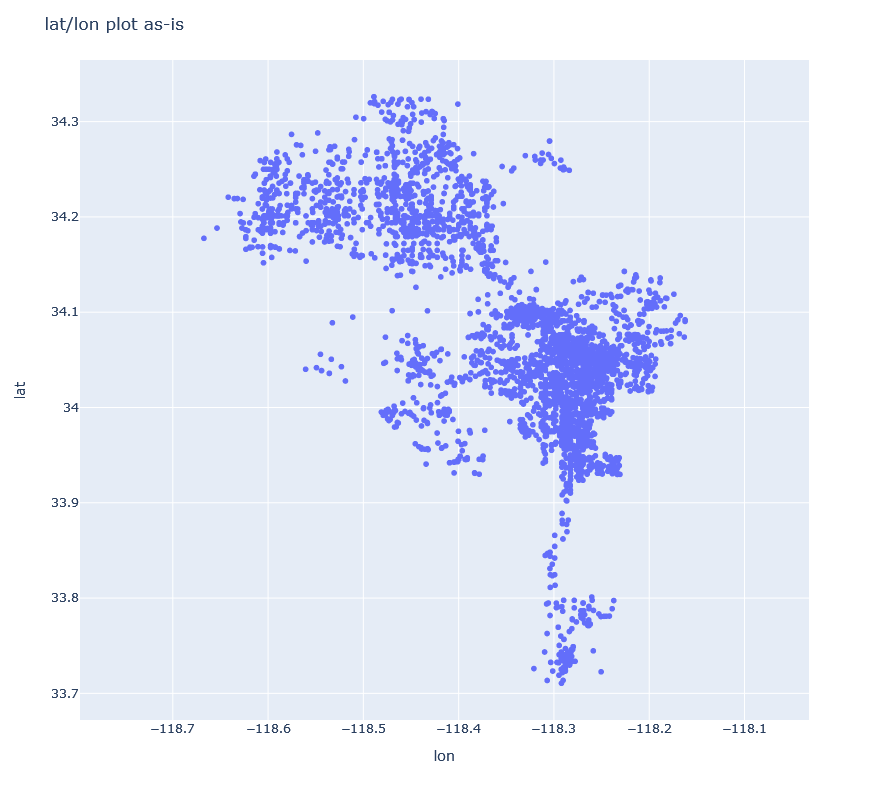

In [34]:
# plot it
fig = px.scatter(arrests_mini,
           x='lon',
           y='lat'
)

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "lat/lon plot as-is"
)

# make it a square grid
fig.update_yaxes(
    scaleanchor = "x",
    scaleratio = 1,
)

fig.show()

## Plotly maps
Plotly has support for a mapbox slippy map. 

- https://plotly.com/python/scattermapbox/

Have fun with this, and change the `mapbox_style` attribute to any of the following:

* `open-street-map`
* `white-bg`
* `carto-positron`
* `carto-darkmatter`
* `stamen-terrain`
* `stamen-toner`
* `stamen-watercolor`


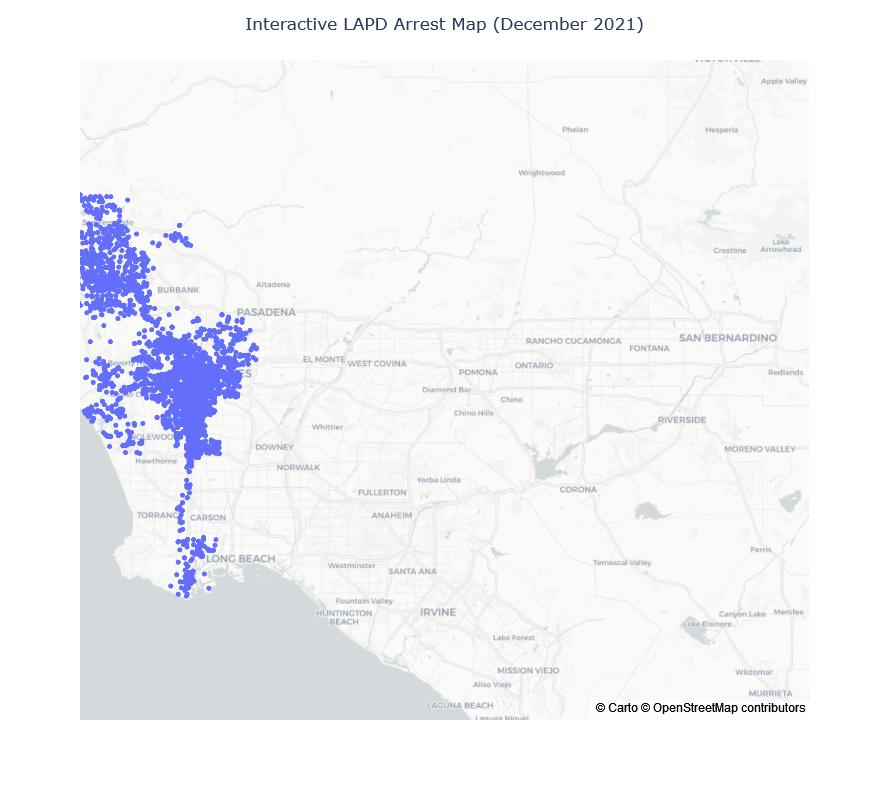

In [35]:
fig = px.scatter_mapbox(arrests_mini,
                        lat='lat',
                        lon='lon',
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LAPD Arrest Map (December 2021)",
    title_x=0.5 # aligns title to center
)

fig.show()

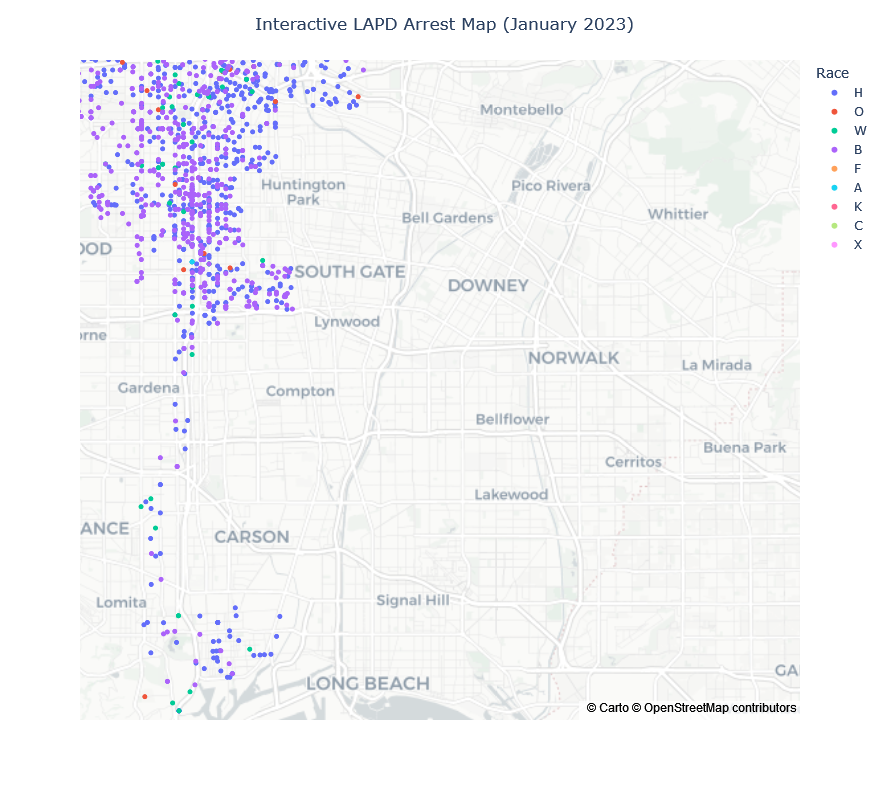

In [36]:
# before you run this cell, what do you think it will produce?
fig = px.scatter_mapbox(arrests_mini, 
                        lat="lat", 
                        lon="lon", 
                        color="descent_cd",
                        labels={'descent_cd':'Race'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LAPD Arrest Map (January 2023)",
    title_x=0.5 # aligns title to center
)


fig.show()

Look at the function below, and see if you can figure out what it is meant to do:

In [37]:
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            arrests_mini[arrests_mini.descent_cd==race], 
                            lat="lat", 
                            lon="lon", 
                            color="descent_cd",
                            labels={'descent_cd':'Race'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "Interactive LAPD Arrest Map (January 2023)<br>Showing where descent label is "+race,
        title_x=0.5 # aligns title to center
    )

    fig.show()

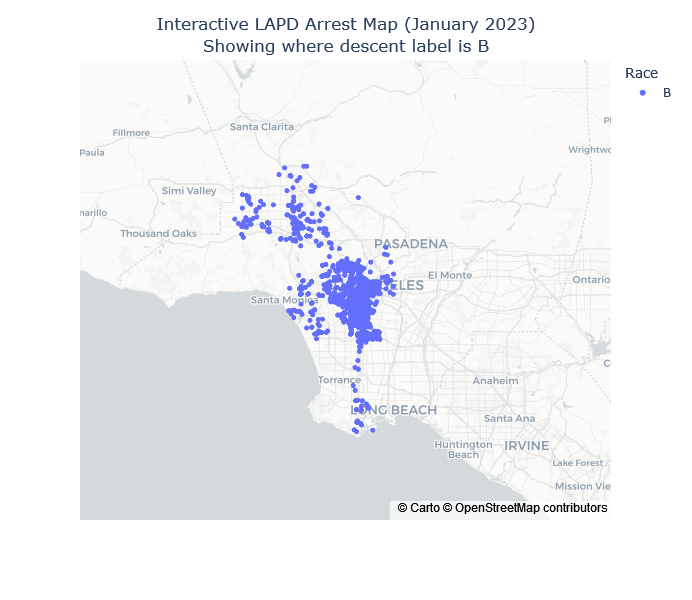

In [38]:
# call the function (try other values)
race_map(race='B')

## Using a loop

In [39]:
# get a list of distinct race values
race_list = arrests_mini.descent_cd.unique().tolist()
race_list

['H', 'O', 'W', 'B', 'F', 'A', 'K', 'C', 'X']

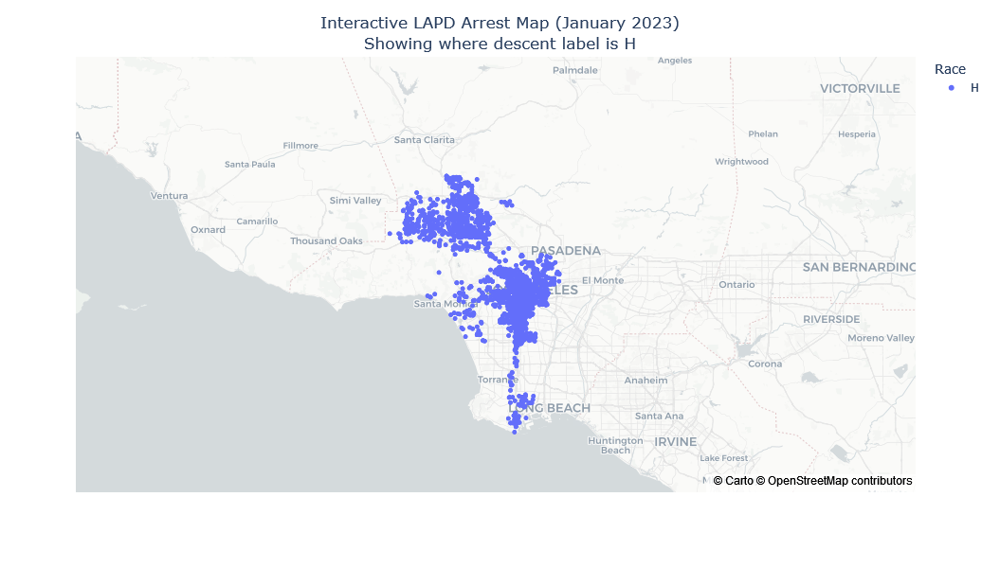

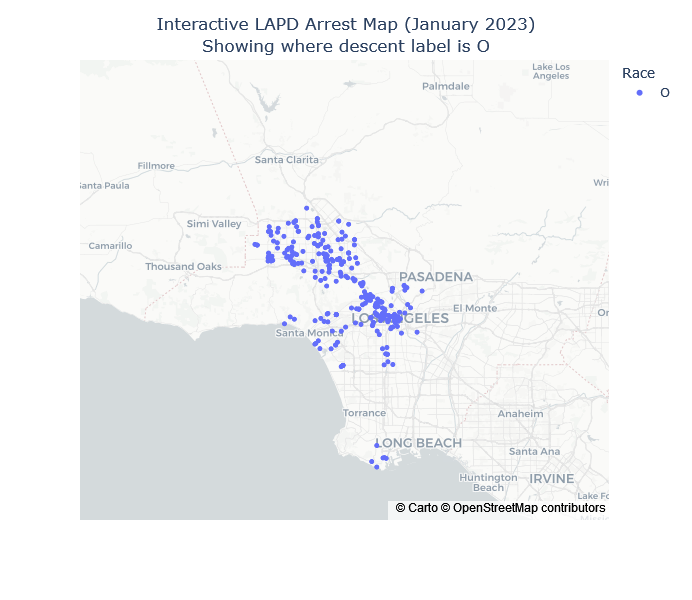

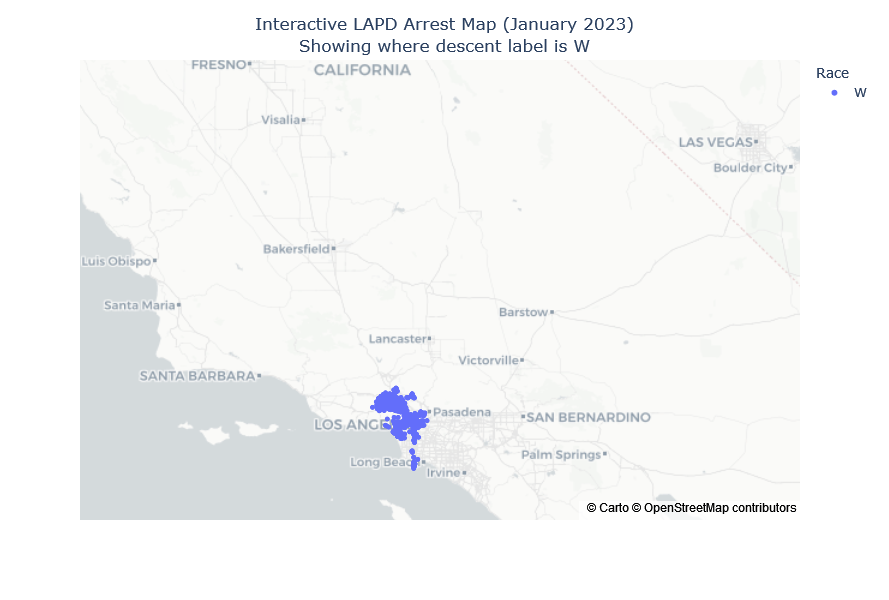

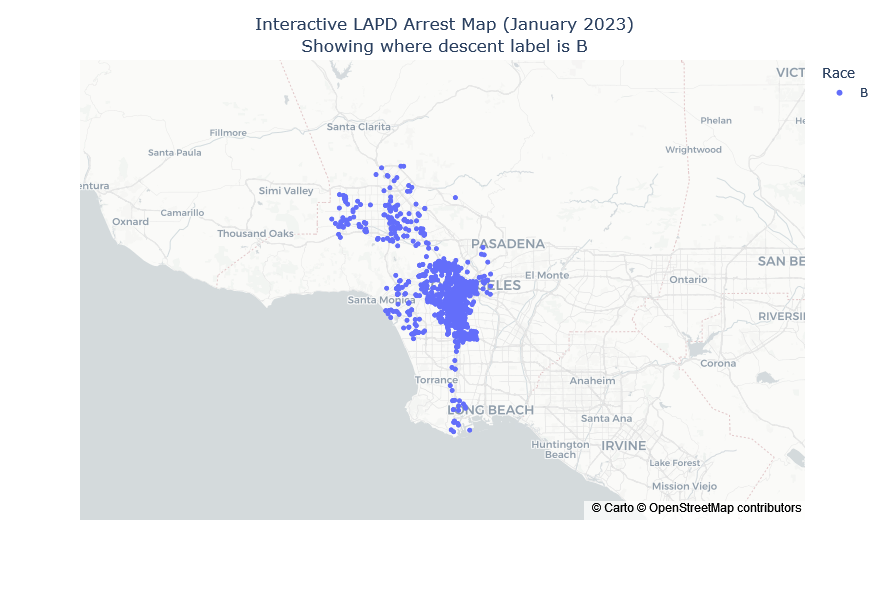

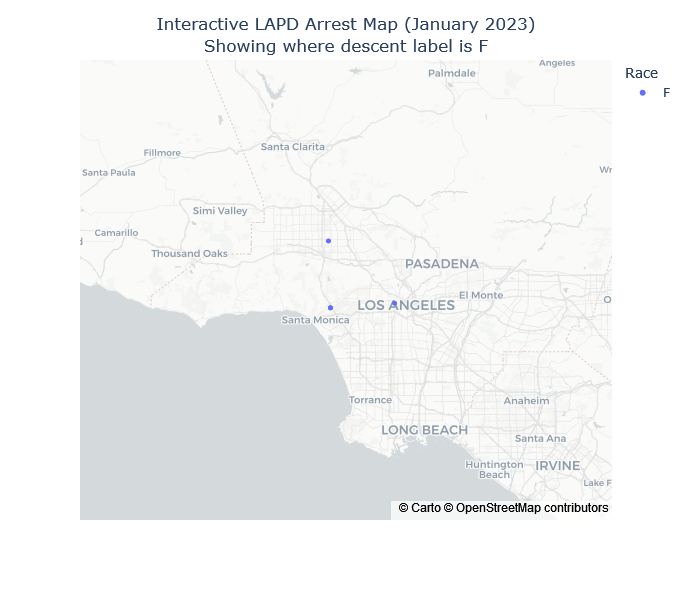

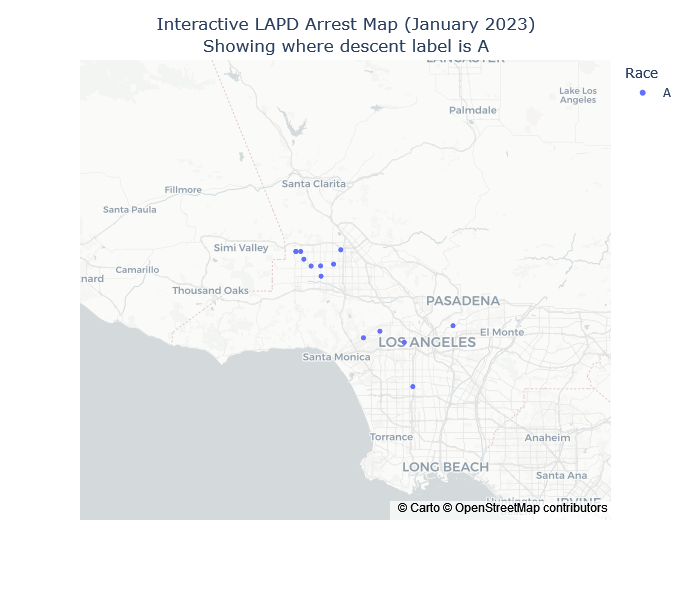

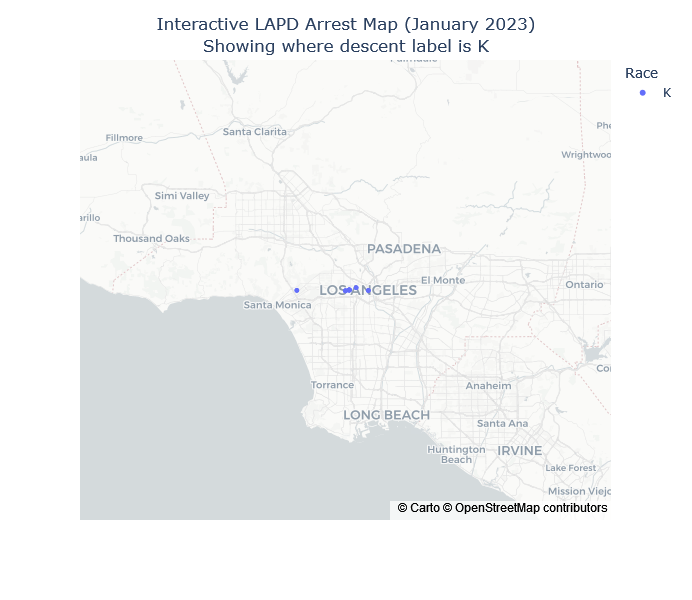

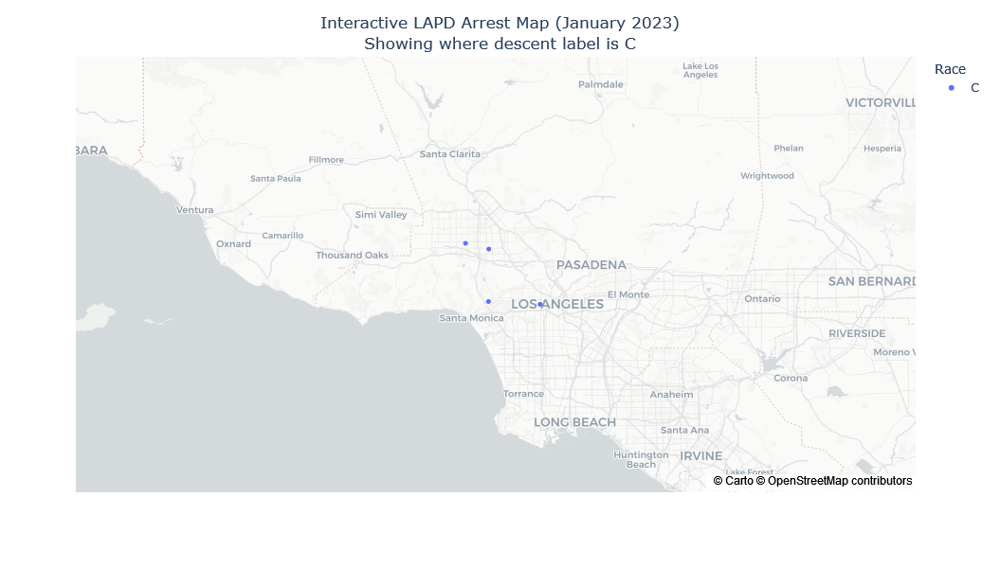

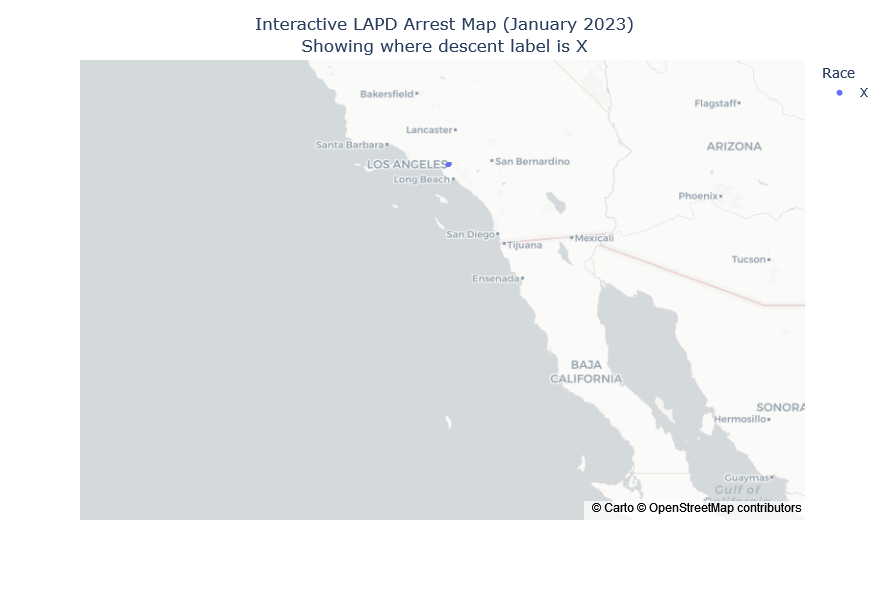

In [40]:
# loop and map!
for race in race_list:
    race_map(race)

# Summarize by neighborhoods

Bring in neighborhoods directly from source:

- https://geohub.lacity.org/datasets/lahub::la-times-neighborhood-boundaries/about

In [41]:
neighborhoods = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

<Axes: >

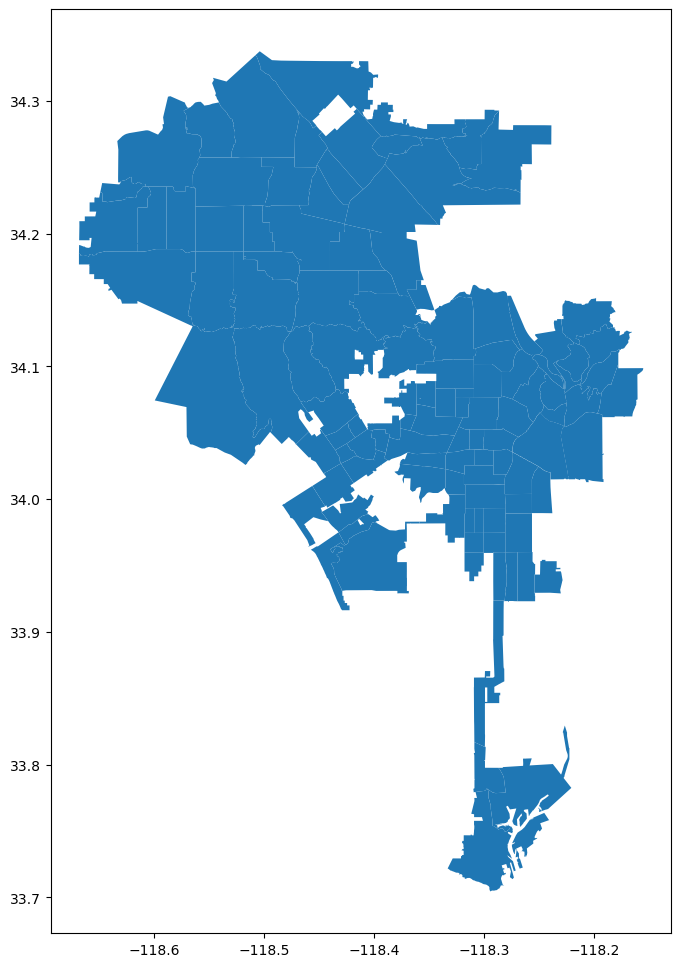

In [42]:
neighborhoods.plot(figsize=(12,12))

<Axes: >

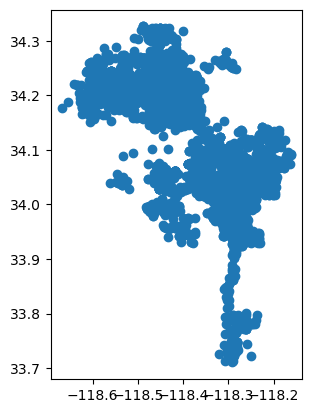

In [43]:
# convert arrests_mini to geodataframe
gdf = gpd.GeoDataFrame(
    arrests_mini, geometry=gpd.points_from_xy(arrests_mini.lon, arrests_mini.lat),crs=4326)

# check that it can be mapped
gdf.plot()

In [44]:
# conduct a spatial join (i.e. assign each arrest to the neighborhood it is in)
arrest_by_neighborhood = gpd.sjoin(neighborhoods, gdf) #Spatial join Points to polygons
arrest_by_neighborhood

,OBJECTID,name,geometry,index_right,arst_date,age,descent_cd,grp_description,lat,lon
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",2325,2023-01-17T00:00:00.000,16,H,Robbery,34.0291,-118.3002
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",2214,2023-01-16T00:00:00.000,31,H,Other Assaults,34.0309,-118.2970
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1015,2023-01-08T00:00:00.000,19,H,Vehicle Theft,34.0327,-118.3002
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1543,2023-01-11T00:00:00.000,39,H,Aggravated Assault,34.0337,-118.3003
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4172,2023-01-28T00:00:00.000,27,H,Vehicle Theft,34.0346,-118.2964
...,...,...,...,...,...,...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",4277,2023-01-29T00:00:00.000,31,H,Miscellaneous Other Violations,34.2084,-118.5143
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",2598,2023-01-19T00:00:00.000,44,H,Forgery/Counterfeit,34.2084,-118.5012
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1949,2023-01-14T00:00:00.000,29,H,Other Assaults,34.2121,-118.5027
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",1658,2023-01-12T00:00:00.000,39,H,Aggravated Assault,34.2164,-118.5143


In [45]:
# count the number of records per community
arrest_counts = arrest_by_neighborhood.value_counts('name').reset_index(name='arrest_count')
arrest_counts

,name,arrest_count
0,Downtown,392
1,Westlake,277
2,Van Nuys,232
3,Hollywood,214
4,Florence,128
...,...,...
107,Elysian Valley,2
108,Cheviot Hills,1
109,Beverlywood,1
110,Bel-Air,1


In [46]:
# add the count to the neighborhoods
neighborhoods = neighborhoods.merge(arrest_counts, how='left', on='name')

In [47]:
neighborhoods.sample(10)

,OBJECTID,name,geometry,arrest_count
103,104,West Adams,"POLYGON ((-118.36955 34.03517, -118.36860 34.0...",13.0
53,54,Lake View Terrace,"POLYGON ((-118.38741 34.29824, -118.38740 34.2...",NaN
80,81,Sawtelle,"POLYGON ((-118.44394 34.04720, -118.43526 34.0...",43.0
107,108,West Los Angeles,"POLYGON ((-118.43421 34.03741, -118.43516 34.0...",11.0
88,89,Sun Valley,"POLYGON ((-118.39006 34.25221, -118.36649 34.2...",72.0
79,80,San Pedro,"MULTIPOLYGON (((-118.28845 33.75438, -118.2885...",63.0
70,71,Palms,"POLYGON ((-118.38835 34.02949, -118.38778 34.0...",21.0
31,32,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0...",45.0
89,90,Sylmar,"POLYGON ((-118.47661 34.33019, -118.47583 34.3...",79.0
99,100,Vermont-Slauson,"POLYGON ((-118.28061 33.99330, -118.28061 33.9...",84.0


<Axes: >

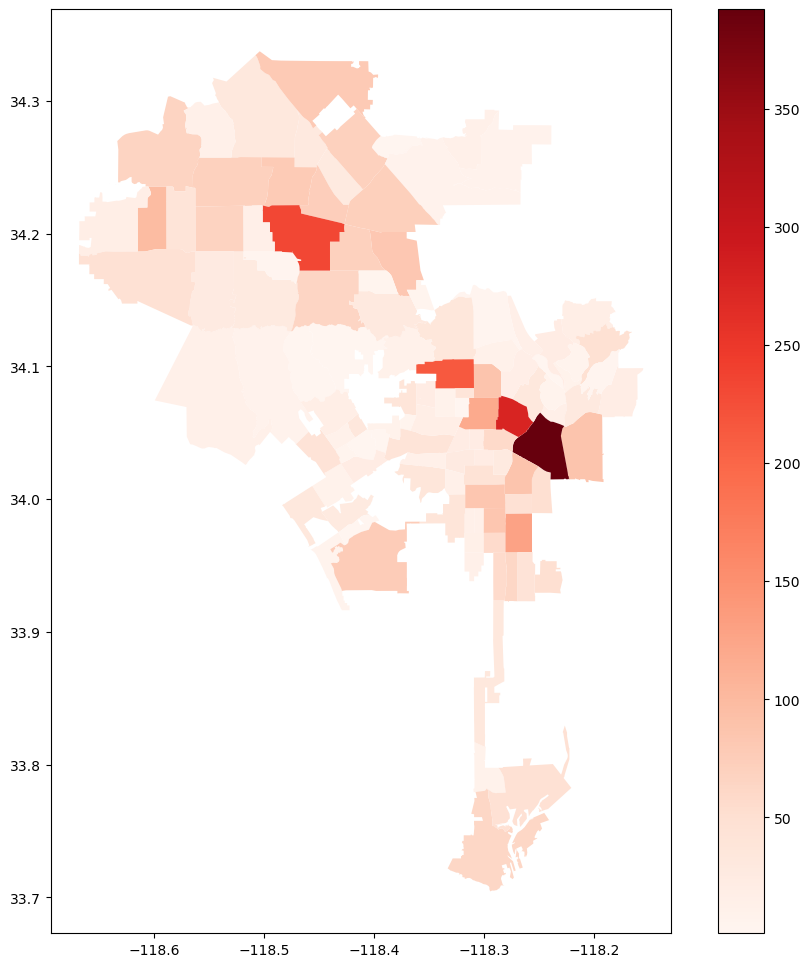

In [48]:
# choropleth map of arrests by neighborhoods
fig,ax = plt.subplots(figsize=(12,12))

neighborhoods.plot(ax=ax,column='arrest_count',legend=True,cmap='Reds')


<div class="alert alert-info">
Now it's your turn!

* Make the final map output "prettier"
* Find a socrata based open dataset
* Use the sodapy library and import it
* Conduct data exploration and analysis
* Create two or more plots using the plotly express library
* Create map visualization using plotly and/or the KeplerGL libraries
</div>
